Display Multiple Frames from Video (Grid of 5×5)

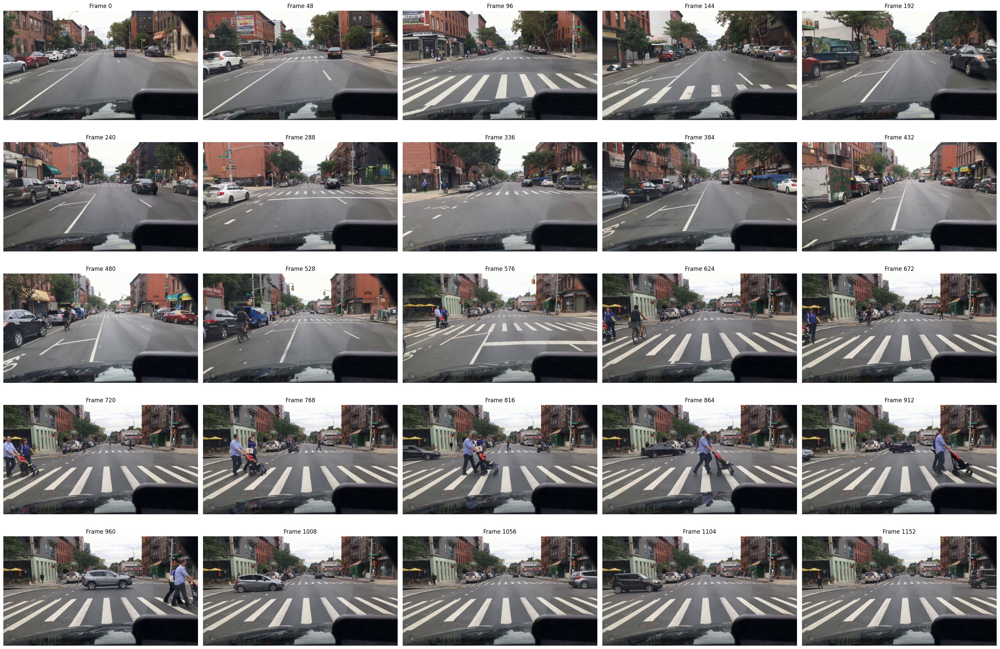

In [10]:
import cv2
import matplotlib.pyplot as plt

# Path to your video
video_path = r'D:\Video-Data-Processing-with-Python-and-OpenCV\converted_output\converted_026c7465-309f6d33.mp4'

# Open the video
cap = cv2.VideoCapture(video_path)
n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

# Frame interval to get 25 frames
interval = max(n_frames // 25, 1)

# Create 5x5 plot
fig, axs = plt.subplots(5, 5, figsize=(30, 20))
axs = axs.flatten()

img_idx = 0
frame_num = 0

while img_idx < 25 and cap.isOpened():
    ret, img = cap.read()
    if not ret:
        break
    if frame_num % interval == 0:
        # Fix orientation
        img = cv2.rotate(img, cv2.ROTATE_90_COUNTERCLOCKWISE)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # Show the frame
        axs[img_idx].imshow(img_rgb)
        axs[img_idx].set_title(f'Frame {frame_num}', fontsize=12)
        axs[img_idx].axis('off')
        img_idx += 1
    frame_num += 1

cap.release()
plt.tight_layout()
plt.show()


Add Annotations to Video Frames

In [11]:
import pandas as pd

# Correct local path to the annotation CSV file
csv_path = r'D:\Video-Data-Processing-with-Python-and-OpenCV\kagglehub\datasets\robikscube\driving-video-with-object-tracking\versions\1\mot_labels.csv'

# Load annotations
labels = pd.read_csv(csv_path, low_memory=False)

# See all unique video names present in the dataset
print(labels['videoName'].unique())

# Display first 5 unique video names
print("First 5 unique video names:")    
labels['videoName'].unique()[:5]


# Filter annotations for the video
video_labels = labels.query('videoName == "026c7465-309f6d33"').reset_index(drop=True).copy()

# Optional: match frame rate to OpenCV frame indices (~11.9 = video frame rate)
video_labels["video_frame"] = (video_labels["frameIndex"] * 11.9).round().astype("int")

print(f"✅ Loaded {len(video_labels)} annotations for the video.")
video_labels.head()


['01c71072-718028b8' '0252f2b5-1f4c92f2' '0153f03b-8fbdc1ad' ...
 '0081e3ea-3f7b0282' '01a70d82-75ba2bd6' '00adbb3f-7757d4ea']
First 5 unique video names:
✅ Loaded 5171 annotations for the video.


,name,videoName,frameIndex,id,category,attributes.crowd,attributes.occluded,attributes.truncated,box2d.x1,box2d.x2,box2d.y1,box2d.y2,haveVideo,video_frame
0,026c7465-309f6d33-0000001.jpg,026c7465-309f6d33,0,107627.0,car,False,False,True,0.000000,153.988439,291.329480,423.319571,True,0
1,026c7465-309f6d33-0000001.jpg,026c7465-309f6d33,0,107628.0,car,False,True,False,68.373245,306.193229,269.925681,380.511974,True,0
2,026c7465-309f6d33-0000001.jpg,026c7465-309f6d33,0,107629.0,car,False,True,False,264.574732,398.943022,262.791082,337.704377,True,0
3,026c7465-309f6d33-0000001.jpg,026c7465-309f6d33,0,107630.0,car,False,True,False,359.036452,450.074319,258.390115,317.489678,True,0
4,026c7465-309f6d33-0000001.jpg,026c7465-309f6d33,0,107631.0,car,False,True,False,411.295127,488.715386,246.777076,305.598679,True,0


In [12]:
video_labels["category"].value_counts()

category
car              3030
pedestrian        847
bicycle           381
rider             320
truck             194
other vehicle     115
bus               109
other person       74
motorcycle         67
trailer            34
Name: count, dtype: int64

In [13]:
import os

video_path = r'D:\Video-Data-Processing-with-Python-and-OpenCV\converted_output\converted_026c7465-309f6d33.mp4'
print("✅ File exists:", os.path.exists(video_path))


✅ File exists: True


In [14]:

cap = cv2.VideoCapture(video_path, cv2.CAP_MSMF)    # Try Windows Media Foundation
# OR
#cap = cv2.VideoCapture(video_path, cv2.CAP_DSHOW)   # Try DirectShow
print("Video opened successfully:", cap.isOpened())


Video opened successfully: True


d:\Video-Data-Processing-with-Python-and-OpenCV\venv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 127902 (\N{FILM FRAMES}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


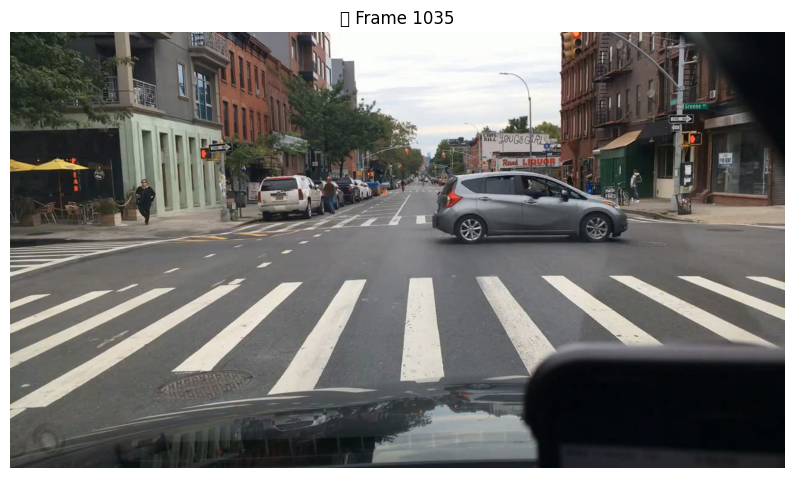

In [15]:
import cv2
import matplotlib.pyplot as plt

video_path = r'D:\Video-Data-Processing-with-Python-and-OpenCV\converted_output\converted_026c7465-309f6d33.mp4'
frame_to_extract = 1035

# Use the working backend
cap = cv2.VideoCapture(video_path, cv2.CAP_MSMF)

cap.set(cv2.CAP_PROP_POS_FRAMES, frame_to_extract)  # Jump to frame 1035
ret, img = cap.read()
cap.release()

if ret:
    img = cv2.rotate(img, cv2.ROTATE_90_COUNTERCLOCKWISE)  # Rotate if needed
    plt.figure(figsize=(10, 8))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(f"🎞️ Frame {frame_to_extract}")
    plt.axis('off')
    plt.show()
else:
    print(f"❌ Couldn't read frame {frame_to_extract}")


d:\Video-Data-Processing-with-Python-and-OpenCV\venv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128230 (\N{PACKAGE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


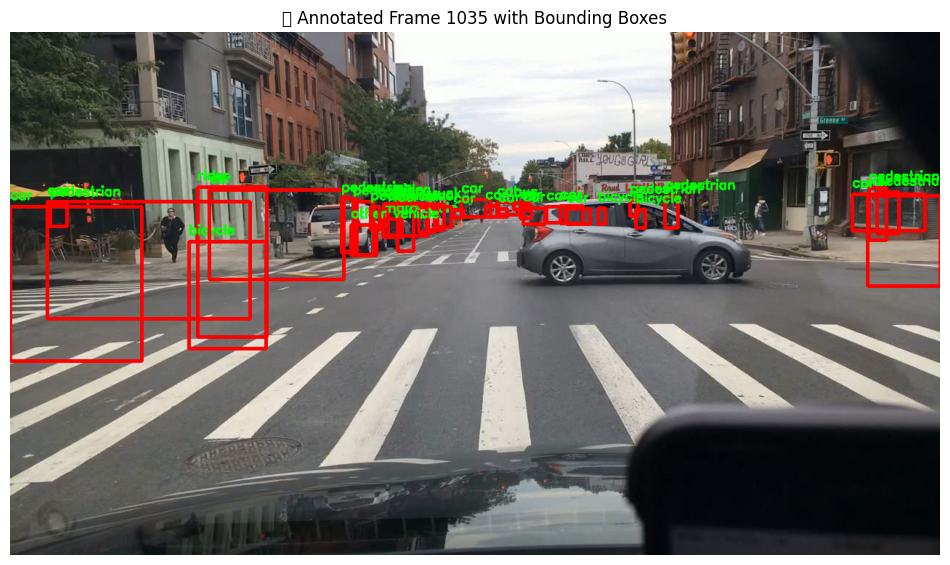

In [16]:
import cv2
import matplotlib.pyplot as plt

# Make a copy of the frame to draw annotations on
img_example = img.copy()

# Get annotations for the desired frame (1035)
frame_labels = video_labels.query('video_frame == 1035')

# Loop through each object detected in this frame and draw bounding boxes
for i, d in frame_labels.iterrows():
    pt1 = int(d['box2d.x1']), int(d['box2d.y1'])  # Top-left corner
    pt2 = int(d['box2d.x2']), int(d['box2d.y2'])  # Bottom-right corner
    cv2.rectangle(img_example, pt1, pt2, (0, 0, 255), 3)  # Draw red box

    # Optional: add label text (e.g., car, bus, etc.)
    label = d['category']
    cv2.putText(img_example, label, (pt1[0], pt1[1] - 10),
                cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)

# Display the annotated image using matplotlib
plt.figure(figsize=(12, 8))
plt.imshow(cv2.cvtColor(img_example, cv2.COLOR_BGR2RGB))
plt.title("📦 Annotated Frame 1035 with Bounding Boxes")
plt.axis('off')
plt.show()


Annotated Frame with Category-Based Colored Boxes and Labels

d:\Video-Data-Processing-with-Python-and-OpenCV\venv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128230 (\N{PACKAGE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


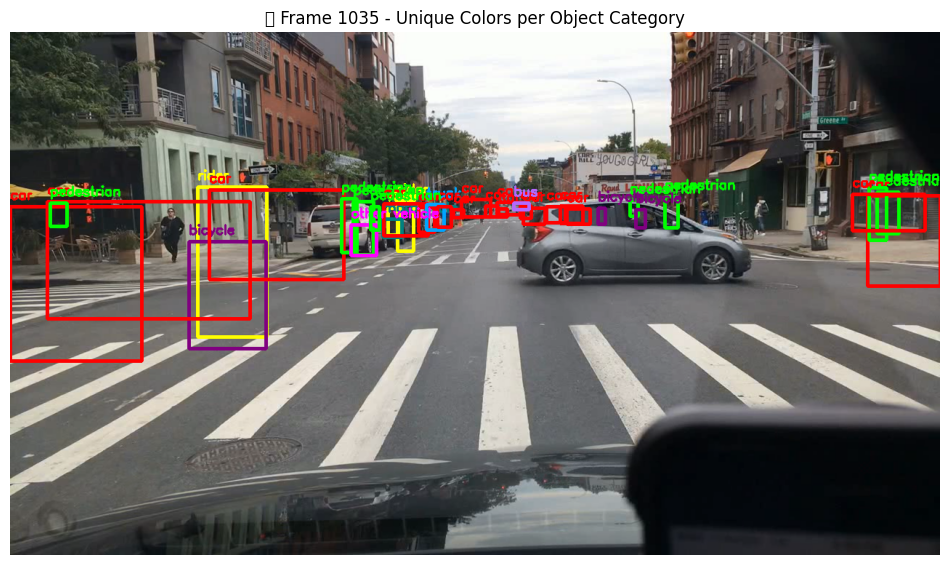

In [17]:
import cv2
import matplotlib.pyplot as plt

# 🔵 Define a distinct color for each object category
color_map = {
    "car": (0, 0, 255),         # 🔴 Red
    "truck": (255, 165, 0),     # 🟧 Orange
    "pedestrian": (0, 255, 0),  # 🟢 Green
    "other vehicle": (255, 0, 255),  # 🟣 Magenta
    "rider": (0, 255, 255),     # 🟡 Yellow (Cyan)
    "bicycle": (128, 0, 128),   # 🟪 Purple
    "other person": (255, 0, 0),# 🔵 Blue
    "trailer": (0, 128, 128),   # 🟦 Teal
    "motorcycle": (128, 128, 0),# 🟤 Olive
    "bus": (255, 105, 180),     # 🌸 Hot Pink
}

# Make a copy of the frame image
img_example = img.copy()

# Filter the annotations for frame 1035
frame_labels = video_labels.query('video_frame == 1035')

# Loop over each object in the frame
for _, d in frame_labels.iterrows():
    pt1 = int(d['box2d.x1']), int(d['box2d.y1'])  # Top-left corner
    pt2 = int(d['box2d.x2']), int(d['box2d.y2'])  # Bottom-right corner

    # Get color based on category; default to white if not defined
    category = d['category']
    color = color_map.get(category, (255, 255, 255))  # ⚪ White fallback

    # Draw bounding box
    cv2.rectangle(img_example, pt1, pt2, color, 3)

    # Draw category label above the box
    cv2.putText(img_example, category, (pt1[0], pt1[1] - 10),
                cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)

# Show the image with annotations
plt.figure(figsize=(12, 8))
plt.imshow(cv2.cvtColor(img_example, cv2.COLOR_BGR2RGB))
plt.title("📦 Frame 1035 - Unique Colors per Object Category")
plt.axis('off')
plt.show()


Display Annotated Frame with Text Labels

d:\Video-Data-Processing-with-Python-and-OpenCV\venv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128444 (\N{FRAME WITH PICTURE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


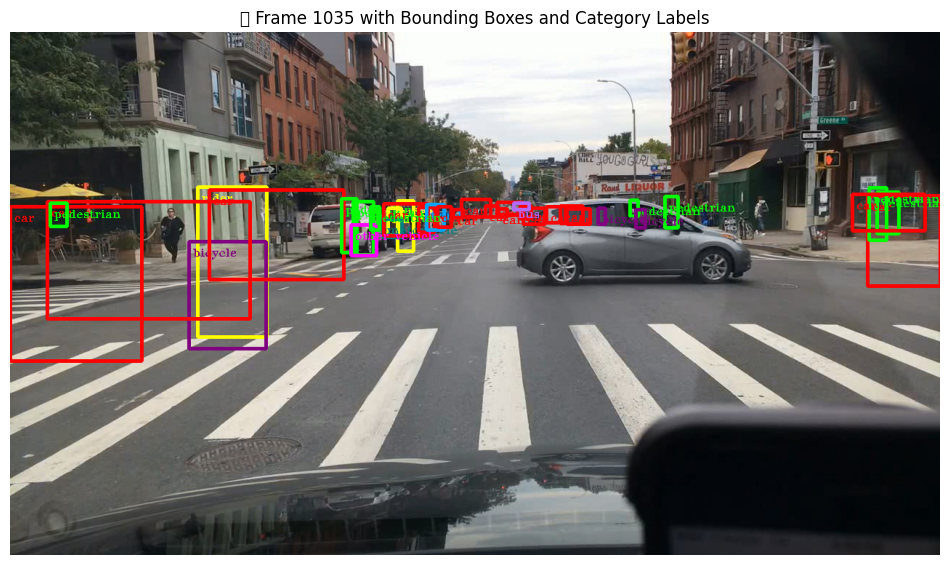

In [18]:
import cv2
import matplotlib.pyplot as plt

# 🎯 Frame to display
frame = 1035

# 🟨 Load frame annotations from the dataframe
frame_labels = video_labels.query("video_frame == @frame")

# 🖼️ Copy the frame image (previously read from video)
img_example = img.copy()

# 🖋️ Font for text labels
font = cv2.FONT_HERSHEY_TRIPLEX

# 🖍️ Loop through each object in the frame and draw bounding boxes + category labels
for _, d in frame_labels.iterrows():
    # Get bounding box points
    pt1 = int(d["box2d.x1"]), int(d["box2d.y1"])
    pt2 = int(d["box2d.x2"]), int(d["box2d.y2"])

    # Color for the category
    color = color_map.get(d["category"], (255, 255, 255))  # Default white if not found

    # Draw rectangle
    img_example = cv2.rectangle(img_example, pt1, pt2, color, 3)

    # Position for category text
    pt_text = int(d["box2d.x1"]) + 5, int(d["box2d.y1"]) + 20

    # Draw category text
    img_example = cv2.putText(img_example, d["category"], pt_text, font, 0.5, color, 1)

# ✅ Display the annotated frame using matplotlib
plt.figure(figsize=(12, 8))
plt.imshow(cv2.cvtColor(img_example, cv2.COLOR_BGR2RGB))
plt.title(f"🖼️ Frame {frame} with Bounding Boxes and Category Labels")
plt.axis('off')
plt.show()

# 🔚 Release resources
cap.release()


color_map & Video lable

In [ ]:
import pickle
# Save color_map to a pickle file
with open("color_map.pkl", "wb") as f:
    pickle.dump(color_map, f)

print("✅ color_map saved as pickle.")


✅ color_map saved as pickle.


In [22]:
import pickle

# Load the video_labels DataFrame from pickle
with open("video_labels.pkl", "rb") as f:
    video_labels = pickle.load(f)

print("✅ video_labels loaded.")


✅ video_labels loaded.
